In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 500
plt.rcParams['text.color'] = 'w'
plt.rcParams['axes.labelcolor'] = 'k'
plt.rcParams['xtick.color'] = 'w'
plt.rcParams['ytick.color'] = 'w'
plt.rcParams['axes.edgecolor'] = 'w'
plt.rcParams['figure.facecolor'] = 'k'
plt.rcParams['axes.facecolor'] = 'k'
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.colors import LogNorm
from matplotlib.patches import FancyArrowPatch
import matplotlib.colors as colors
from astropy.visualization import SqrtStretch, LinearStretch, LogStretch
from astropy.visualization.mpl_normalize import ImageNormalize
import pandas as pd
import re
from astropy.io import fits
import os
from scipy.ndimage import map_coordinates
from scipy.stats import binned_statistic
from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment
from pathlib import Path
from scipy.stats import gaussian_kde
import seaborn as sns

from matplotlib.lines import Line2D
os.chdir("/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling")

In [21]:
columns = ['strength', 'pa', 'kappa', 'num_images', 'pos_rms', 'mag_rms', 't_shear_str', 't_shear_pa', 't_shear_kappa', 'chi2', 'z', 'x', 'y', 'e', 'pow_pa', 'r_ein', 'pwi'] # manually add columns so naming is without LaTeX symbols
df = pd.read_csv('/Users/ainsleylewis/Documents/Astronomy/IllustrisTNG Lens Modelling/Test/Sim 7_summary.csv', header=None, names=columns, skiprows=1) 
df

,strength,pa,kappa,num_images,pos_rms,mag_rms,t_shear_str,t_shear_pa,t_shear_kappa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.01,0.0,-0.50,4,0.000031,8.993275,0.040716,-35.02160,-0.125377,0.000002,1.0,20.81338,20.76582,0.097531,29.641650,0.551366,2.005237
1,0.01,0.0,-0.39,4,0.000031,2.971100,0.033609,-33.45064,0.069609,0.000005,1.0,20.81270,20.76139,0.158006,16.825340,0.464011,2.299229
2,0.01,0.0,-0.28,4,0.000031,3.037325,0.036692,-55.53861,-0.193068,0.000002,1.0,20.81144,20.75056,0.253310,5.552743,0.573020,2.165021
3,0.01,0.0,-0.17,4,0.000031,3.692775,0.036046,-38.45507,-0.075181,0.000002,1.0,20.81284,20.76177,0.130977,18.245150,0.523715,2.107193
4,0.01,0.0,-0.06,4,0.000031,20.254650,0.047431,-31.41273,-0.182036,0.000003,1.0,20.81393,20.76987,0.087829,44.766880,0.591984,1.885656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.50,360.0,0.06,4,0.000031,2.488850,0.171804,349.35140,-0.108962,0.000002,1.0,20.81899,20.83628,0.609353,81.600170,0.566854,2.087866
4996,0.50,360.0,0.17,4,0.000031,294.154900,0.097350,331.13750,-0.468956,0.000003,1.0,20.81871,20.77757,0.160079,60.171790,0.789494,1.808201
4997,0.50,360.0,0.28,7,NaN,NaN,0.105476,353.31970,-1.211379,0.000002,1.0,20.80836,20.78118,0.165249,83.251790,0.922136,2.258003
4998,0.50,360.0,0.39,4,0.000031,5.373750,0.104418,327.90910,-1.698830,0.000002,1.0,20.81350,20.76683,0.100059,33.127670,1.215180,2.093539


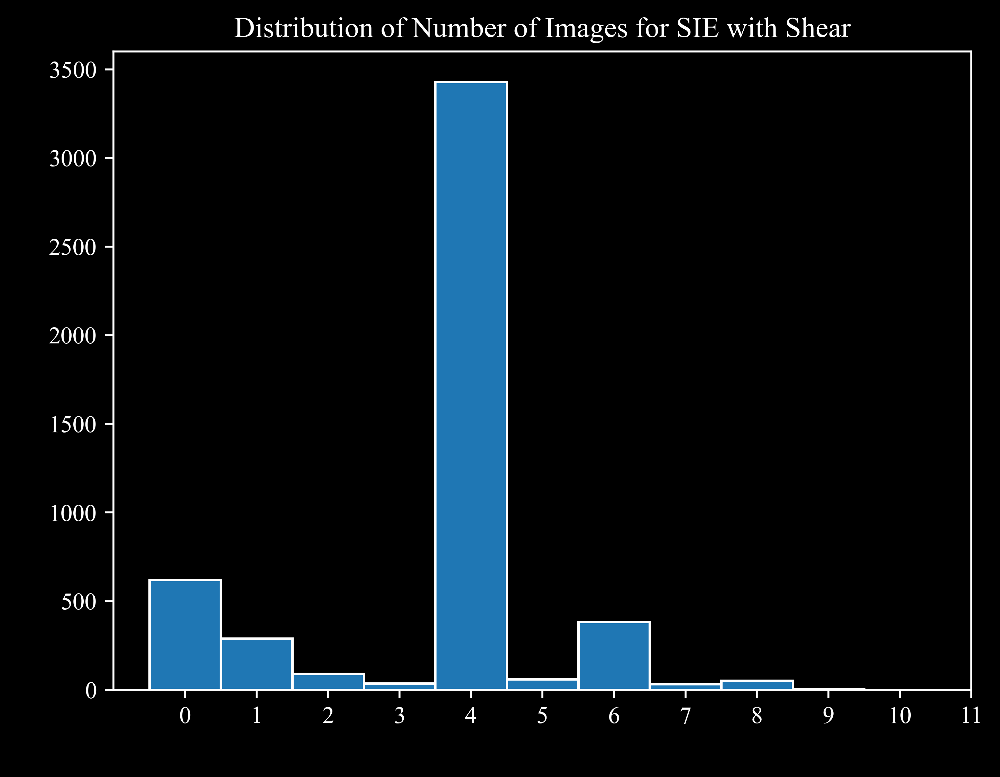

In [ ]:
plt.hist(df['num_images'], bins=range(0, 11), align='left', edgecolor='w')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images for POW with Shear')
plt.xticks([0,1,2,3,4,5,6,7,8,9,10,11])
plt.show()

In [23]:
mask = df['num_images'] == 4
filtered_df_0 = df[mask]
filtered_df_0 = filtered_df_0.reset_index(drop=True)

# Precentage of 4 image models 
percentage_4_images = (len(filtered_df_0) / len(df)) * 100
print(f"Percentage of 4 image models: {percentage_4_images:.2f}%")

Percentage of 4 image models: 68.60%


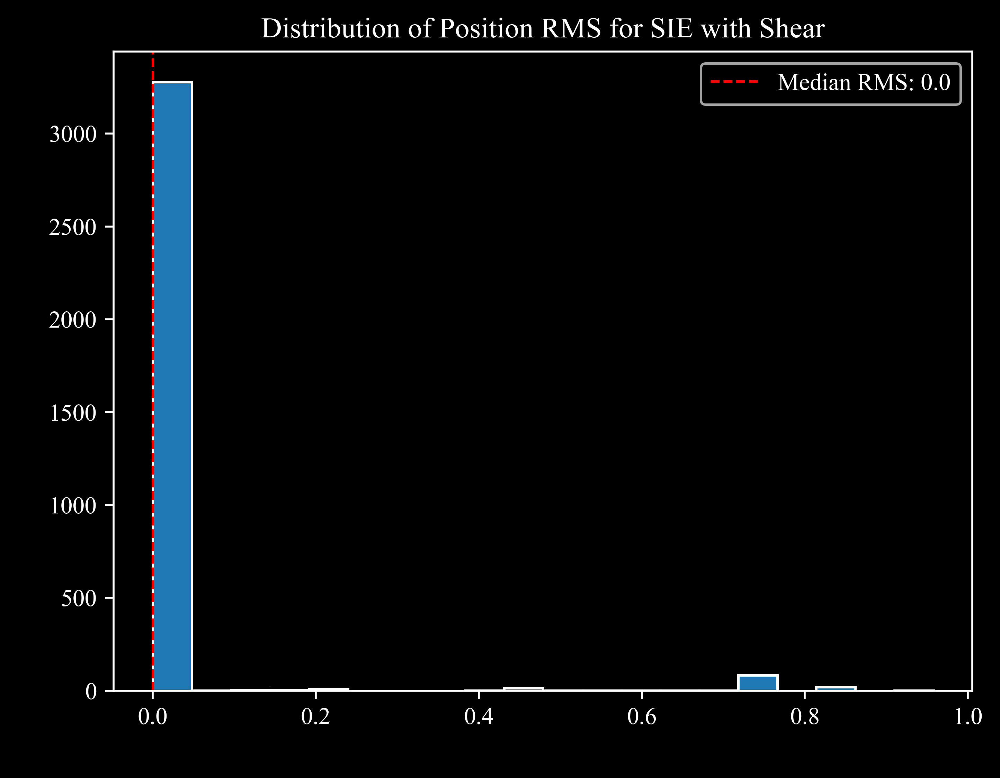

In [ ]:
plt.hist(filtered_df_0['pos_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['pos_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['pos_rms'].median(), 4)))
plt.xlabel('Position RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Position RMS for POW with Shear')
plt.show()

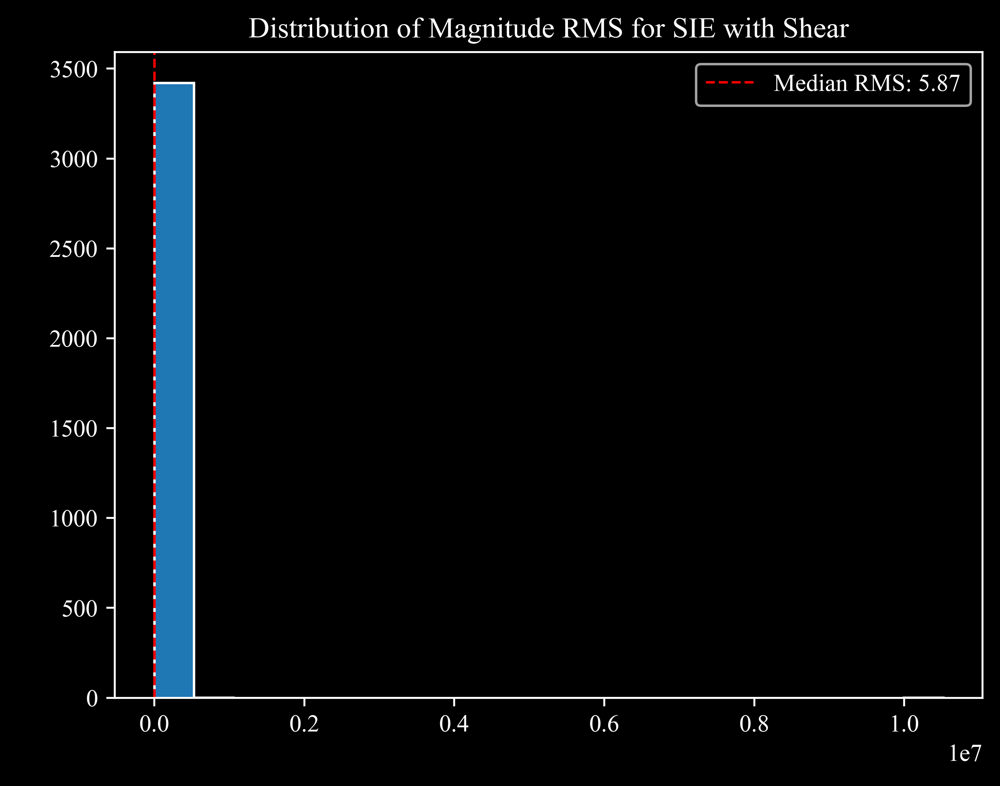

In [ ]:
plt.hist(filtered_df_0['mag_rms'], bins=20, edgecolor='w')
plt.axvline(filtered_df_0['mag_rms'].median(), color='r', linestyle='dashed', linewidth=1, label='Median RMS: ' + str(round(filtered_df_0['mag_rms'].median(), 2)))
plt.xlabel('Magnitude RMS')
plt.ylabel('Frequency')
plt.legend()
plt.title('Distribution of Magnitude RMS for POW with Shear')
plt.show()

In [26]:
mask2 = filtered_df_0['pos_rms']  == 3.101229586803652e-05
filtered_df = filtered_df_0[mask2]
filtered_df = filtered_df.reset_index(drop=True)
filtered_df

,strength,pa,kappa,num_images,pos_rms,mag_rms,t_shear_str,t_shear_pa,t_shear_kappa,chi2,z,x,y,e,pow_pa,r_ein,pwi
0,0.01,0.0,-0.50,4,0.000031,8.993275,0.040716,-35.02160,-0.125377,0.000002,1.0,20.81338,20.76582,0.097531,29.641650,0.551366,2.005237
1,0.01,0.0,-0.39,4,0.000031,2.971100,0.033609,-33.45064,0.069609,0.000005,1.0,20.81270,20.76139,0.158006,16.825340,0.464011,2.299229
2,0.01,0.0,-0.28,4,0.000031,3.037325,0.036692,-55.53861,-0.193068,0.000002,1.0,20.81144,20.75056,0.253310,5.552743,0.573020,2.165021
3,0.01,0.0,-0.17,4,0.000031,3.692775,0.036046,-38.45507,-0.075181,0.000002,1.0,20.81284,20.76177,0.130977,18.245150,0.523715,2.107193
4,0.01,0.0,-0.06,4,0.000031,20.254650,0.047431,-31.41273,-0.182036,0.000003,1.0,20.81393,20.76987,0.087829,44.766880,0.591984,1.885656
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2970,0.50,360.0,-0.28,4,0.000031,22.222525,0.064496,334.09980,-0.218346,0.000004,1.0,20.81522,20.77468,0.145734,58.258000,0.577879,2.201427
2971,0.50,360.0,-0.17,4,0.000031,12.203950,0.168863,331.74390,-1.616117,0.000003,1.0,20.81808,20.77656,0.207775,238.975300,1.036256,2.286606
2972,0.50,360.0,0.06,4,0.000031,2.488850,0.171804,349.35140,-0.108962,0.000002,1.0,20.81899,20.83628,0.609353,81.600170,0.566854,2.087866
2973,0.50,360.0,0.17,4,0.000031,294.154900,0.097350,331.13750,-0.468956,0.000003,1.0,20.81871,20.77757,0.160079,60.171790,0.789494,1.808201


In [27]:
# Percentage Calc
num_goodfit = len(filtered_df)
num_total = len(df[df['num_images'] == 4])
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits out of 4 image models: {percentage_goodfit:.2f}%")

num_goodfit = len(filtered_df)
num_total = len(df)
percentage_goodfit = (num_goodfit / num_total) * 100
print(f"Percentage of good fits: {percentage_goodfit:.2f}%")

Percentage of good fits out of 4 image models: 86.73%
Percentage of good fits: 59.50%


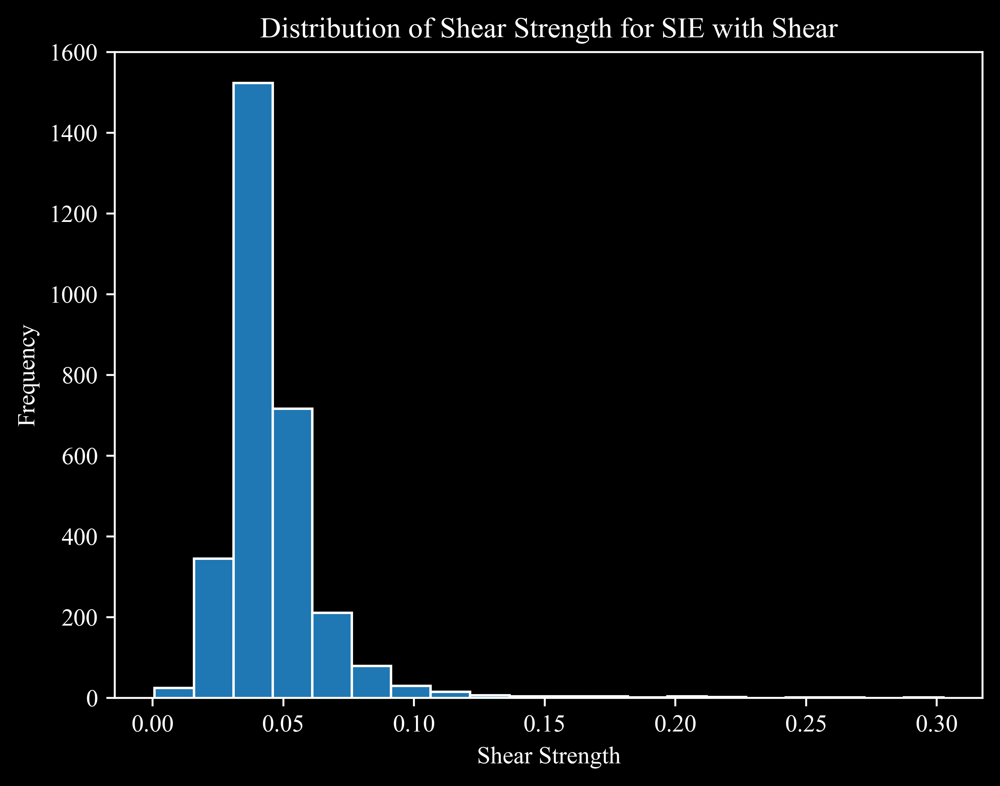

In [ ]:
plt.hist(filtered_df['t_shear_str'], bins=20, edgecolor='w')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Strength for POW with Shear')
plt.show()

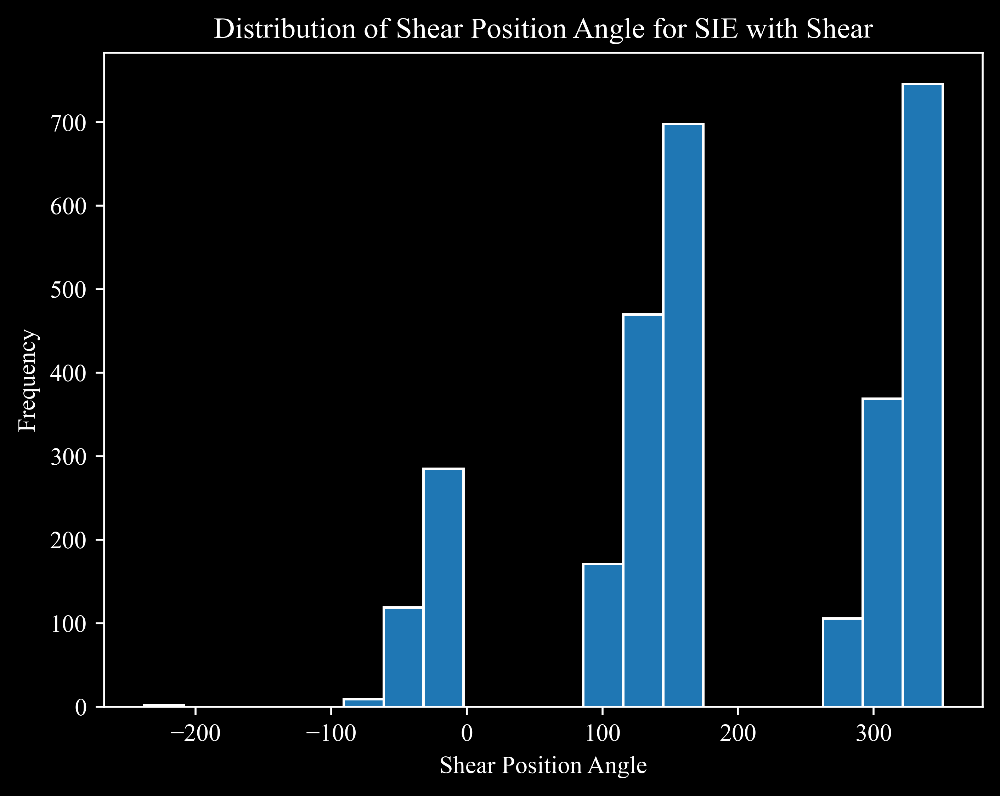

In [ ]:
plt.hist(filtered_df['t_shear_pa'], bins=20, edgecolor='w')
plt.xlabel('Shear Position Angle', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Position Angle for POW with Shear')
plt.show()

In [30]:
aligned_pa = (filtered_df['t_shear_pa'] > 100) & (filtered_df['t_shear_pa'] < 200)
num_aligned = len(filtered_df[aligned_pa])
print(f"Number of aligned shear position angles: {num_aligned}")
anti_aligned_pa = (filtered_df['t_shear_pa'] < 0) | (filtered_df['t_shear_pa'] > 200)
print(f"Number of anti-aligned shear position angles: {len(filtered_df[anti_aligned_pa])}")

# Percentage
percentage_aligned = (num_aligned / len(filtered_df)) * 100
print(f"Percentage of aligned shear position angles: {percentage_aligned:.2f}%")
percentage_anti_aligned = (len(filtered_df[anti_aligned_pa]) / len(filtered_df)) * 100
print(f"Percentage of anti-aligned shear position angles: {percentage_anti_aligned:.2f}%")

Number of aligned shear position angles: 1308
Number of anti-aligned shear position angles: 1636
Percentage of aligned shear position angles: 43.97%
Percentage of anti-aligned shear position angles: 54.99%


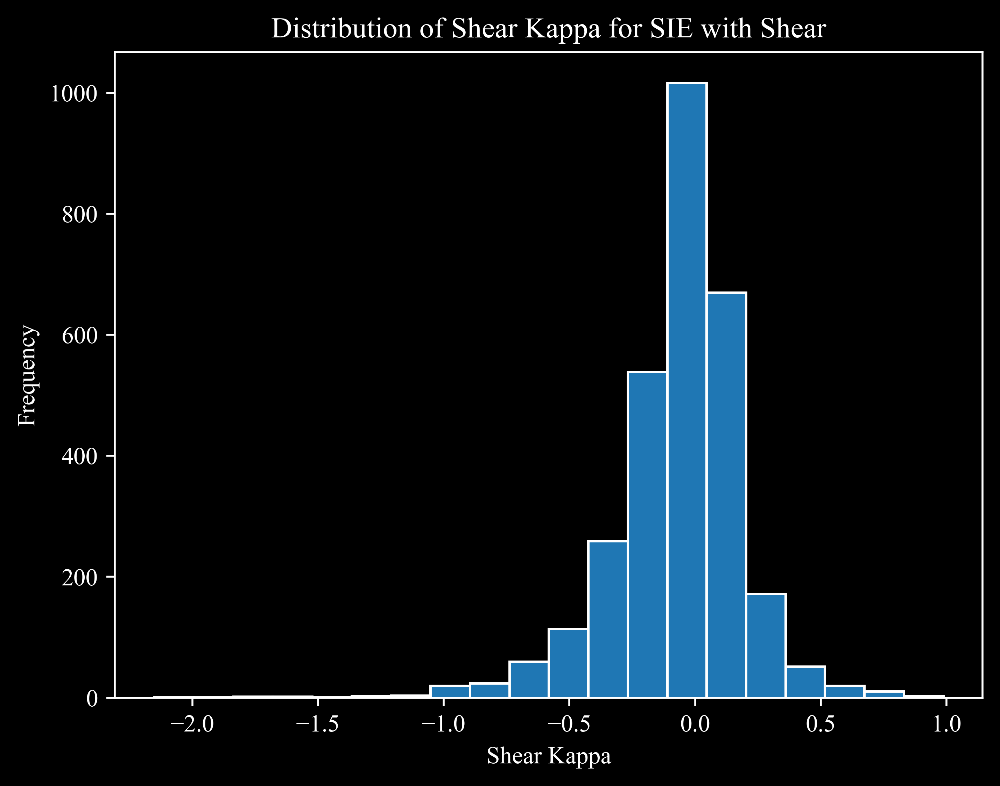

In [ ]:
plt.hist(filtered_df['t_shear_kappa'], bins=20, edgecolor='w')
plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Shear Kappa for POW with Shear')
plt.show()

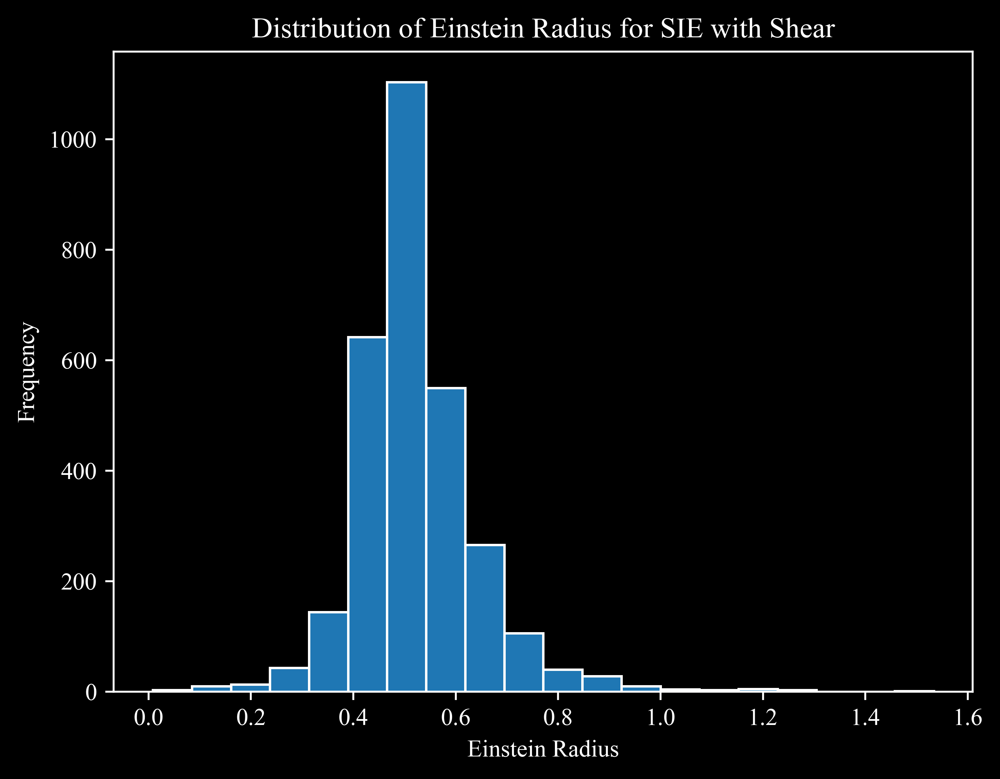

In [ ]:
plt.hist(filtered_df['r_ein'], bins=20, edgecolor='w')
plt.xlabel('Einstein Radius', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of Einstein Radius for POW with Shear')
plt.show()

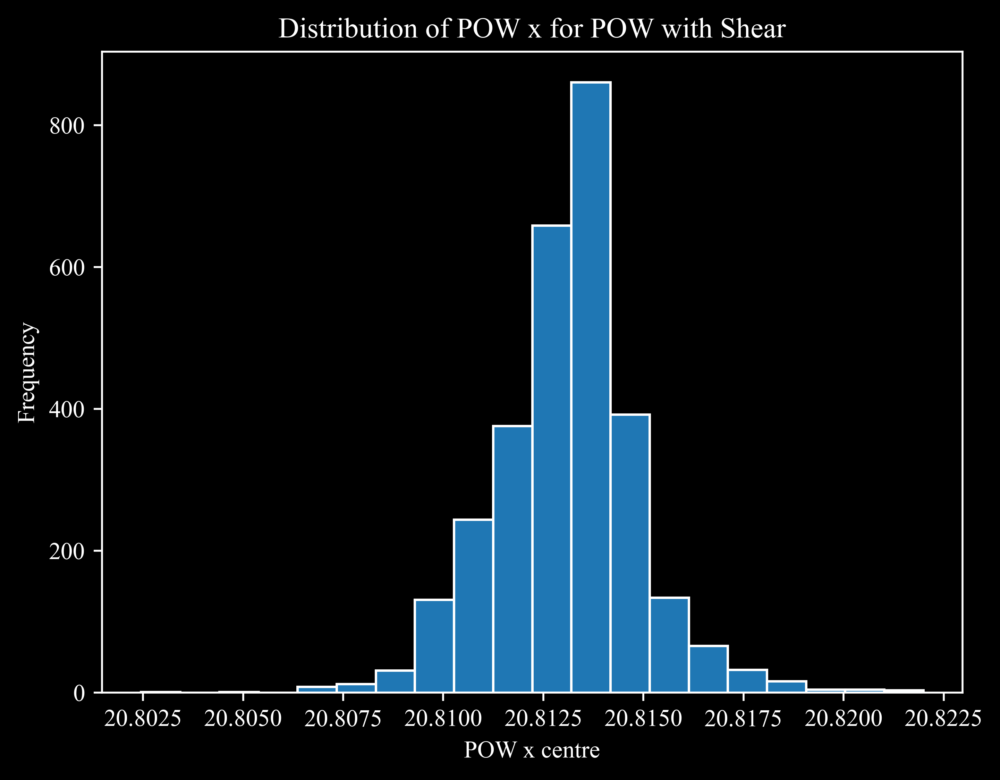

In [35]:
plt.hist(filtered_df['x'], bins=20, edgecolor='w')
plt.xlabel('POW x centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW x for POW with Shear')
plt.show()

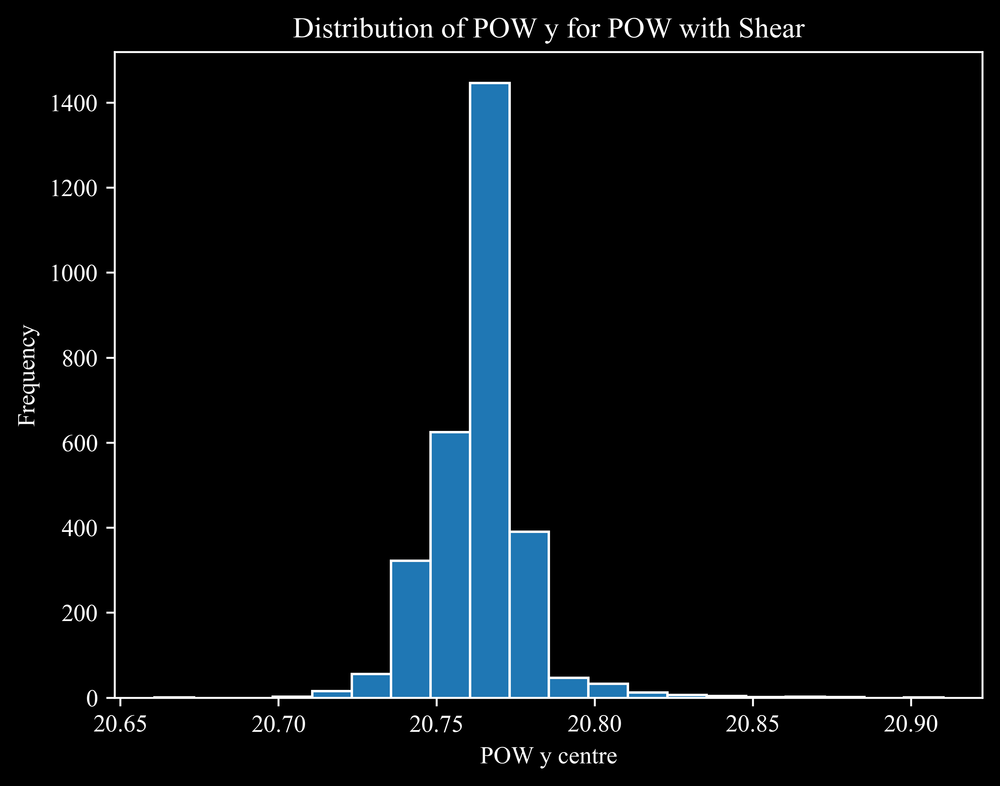

In [36]:
plt.hist(filtered_df['y'], bins=20, edgecolor='w')
plt.xlabel('POW y centre', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW y for POW with Shear')
plt.show()

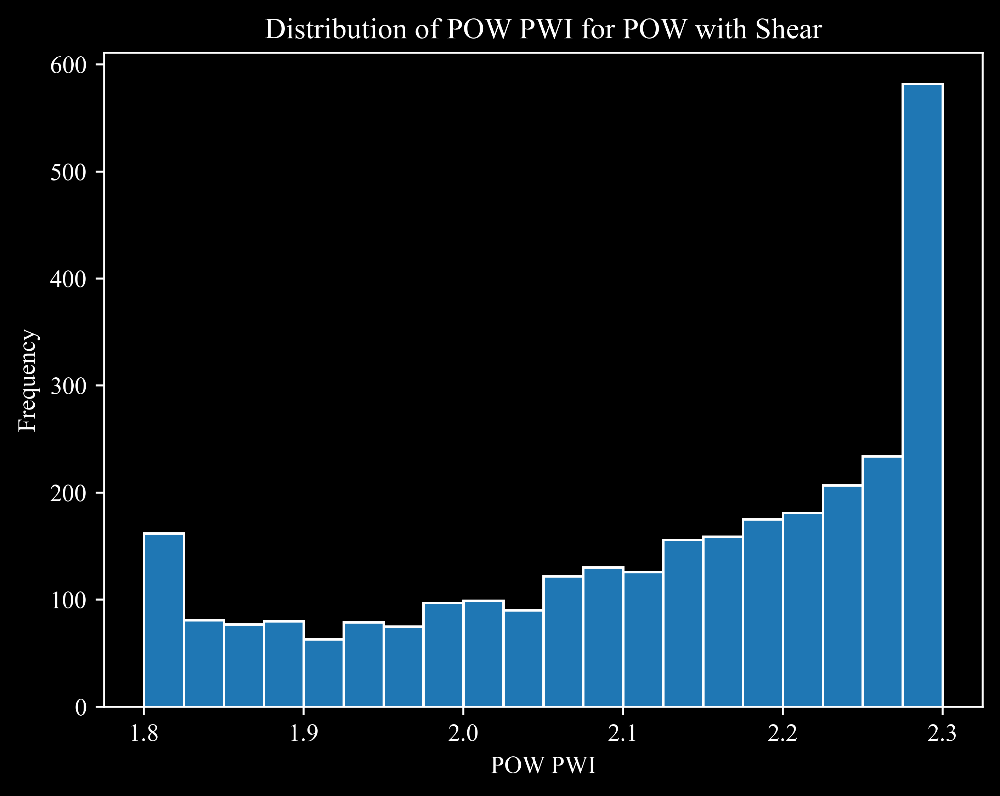

In [37]:
plt.hist(filtered_df['pwi'], bins=20, edgecolor='w')
plt.xlabel('POW PWI', color = 'w')
plt.ylabel('Frequency', color = 'w')
plt.title('Distribution of POW PWI for POW with Shear')
plt.show()

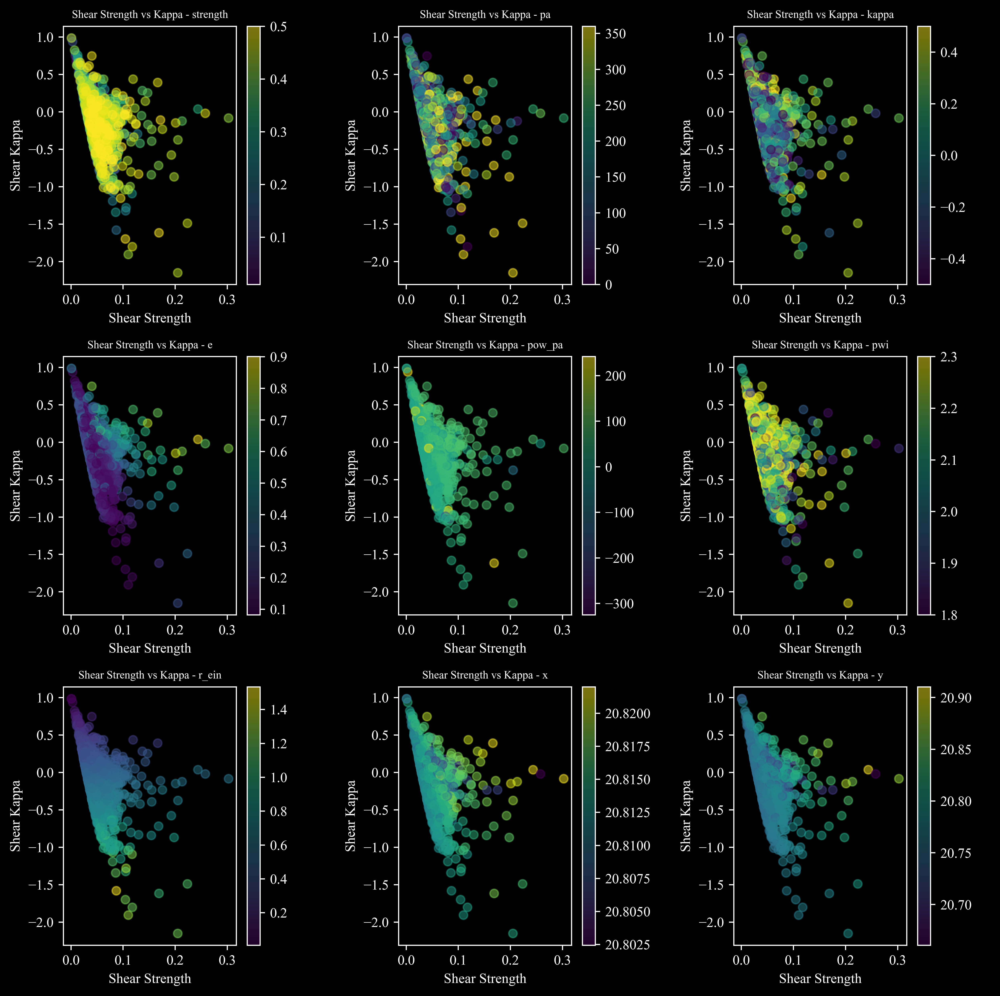

In [41]:
plt.figure(figsize=(10, 10))    

columns = ['strength', 'pa', 'kappa', 'e', 'pow_pa', 'pwi', 'r_ein', 'x', 'y']

for i in range(min(9, len(columns))):
    column = columns[i]
    plt.subplot(3, 3, i + 1)
    plt.scatter(filtered_df['t_shear_str'], filtered_df['t_shear_kappa'], c=filtered_df[column], alpha=0.5)
    plt.colorbar(label=f'{column}')
    plt.xlabel('Shear Strength', color = 'w')
    plt.ylabel('Shear Kappa', color = 'w')
    plt.title(f'Shear Strength vs Kappa - {column}', color = 'w', fontsize=8)
plt.tight_layout()
plt.show()


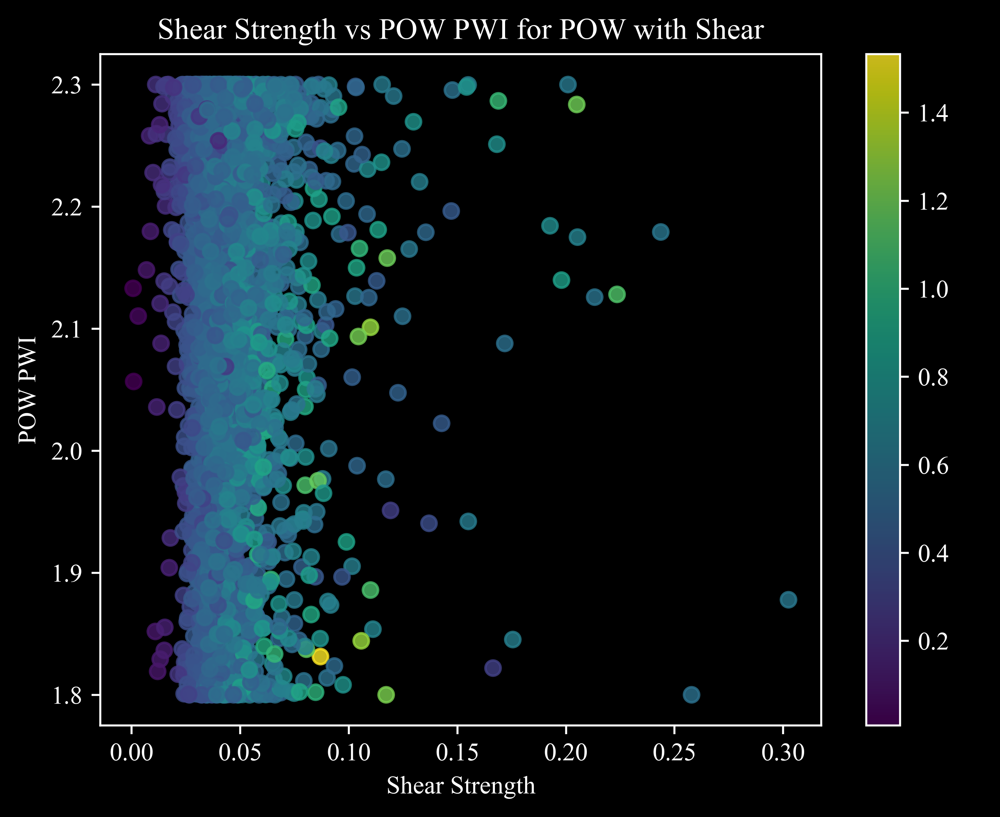

In [57]:
plt.scatter(filtered_df['t_shear_str'], filtered_df['pwi'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('Shear Strength vs POW PWI for POW with Shear')
plt.show()

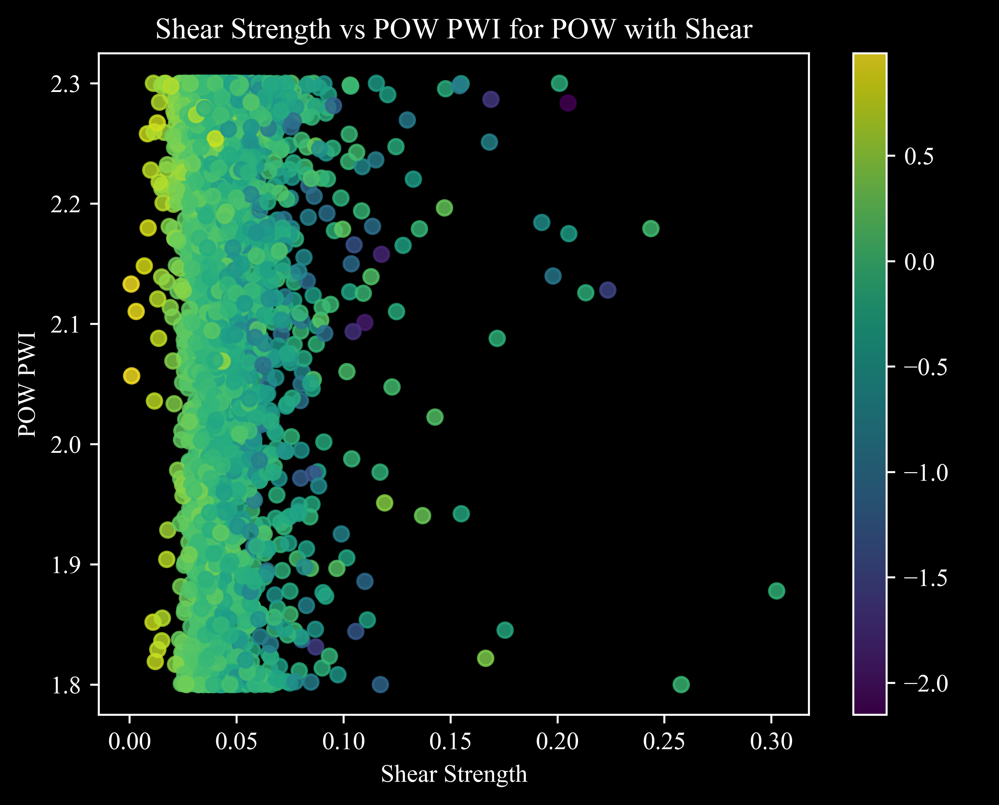

In [58]:
plt.scatter(filtered_df['t_shear_str'], filtered_df['pwi'], c=filtered_df['t_shear_kappa'], alpha=0.8)
plt.colorbar(label='Shear Kappa')
plt.xlabel('Shear Strength', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('Shear Strength vs POW PWI for POW with Shear')
plt.show()

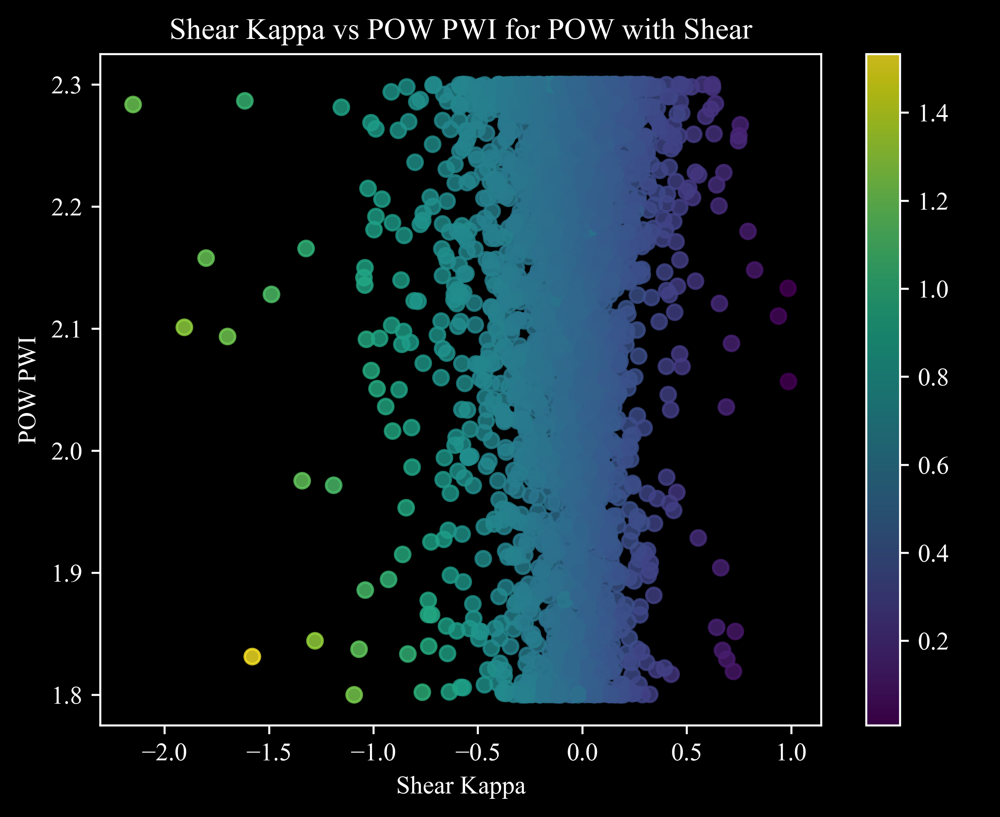

In [59]:
plt.scatter(filtered_df['t_shear_kappa'], filtered_df['pwi'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('Shear Kappa', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('Shear Kappa vs POW PWI for POW with Shear')
plt.show()

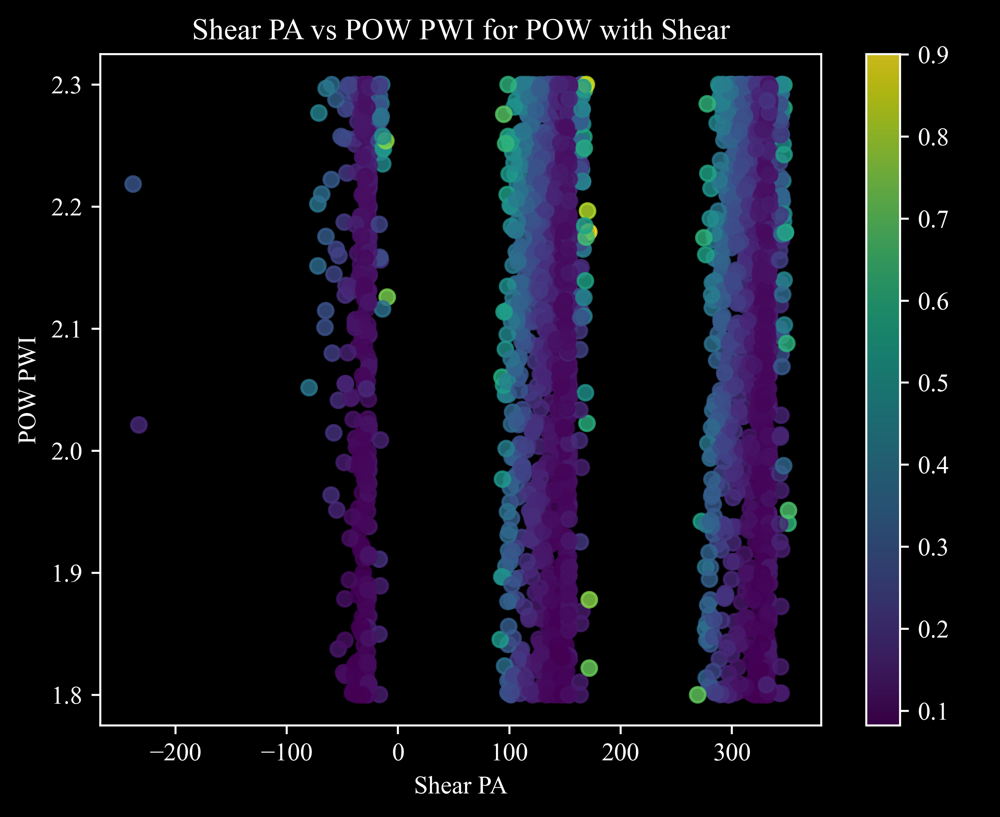

In [71]:
plt.scatter(filtered_df['t_shear_pa'], filtered_df['pwi'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('Shear PA', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('Shear PA vs POW PWI for POW with Shear')
plt.show()

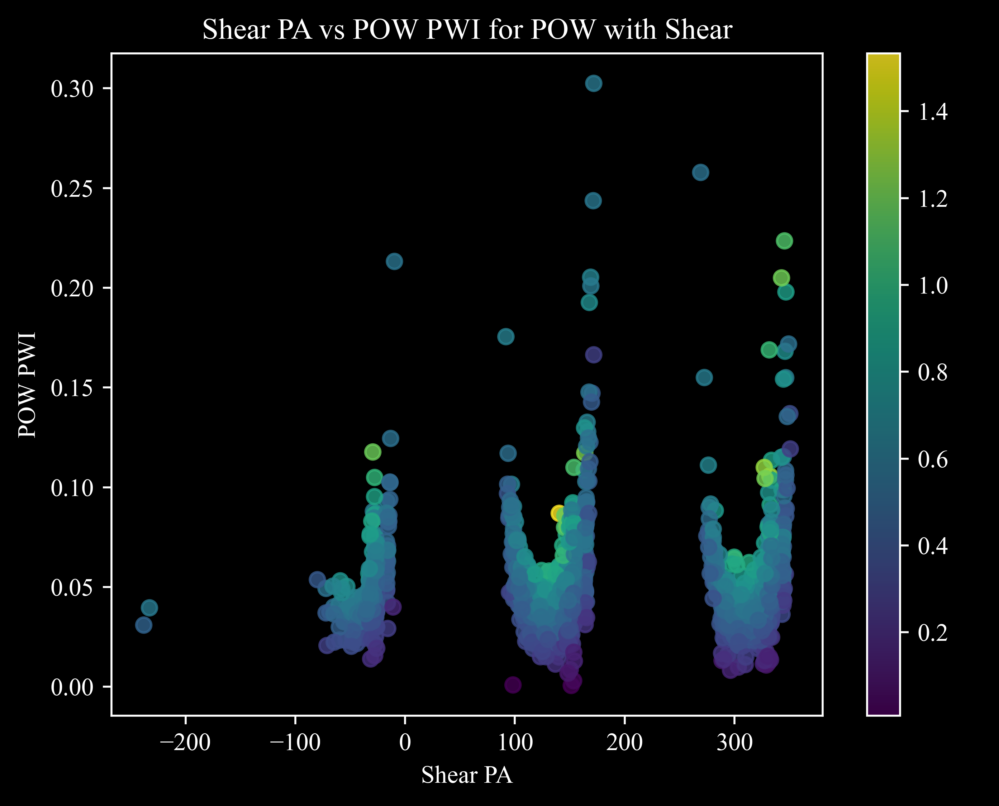

In [75]:
plt.scatter(filtered_df['t_shear_pa'], filtered_df['t_shear_str'], c=filtered_df['r_ein'], alpha=0.8)
plt.colorbar(label='Einstein Radius')
plt.xlabel('Shear PA', color = 'w')
plt.ylabel('POW PWI', color = 'w')
plt.title('Shear PA vs POW PWI for POW with Shear')
plt.show()

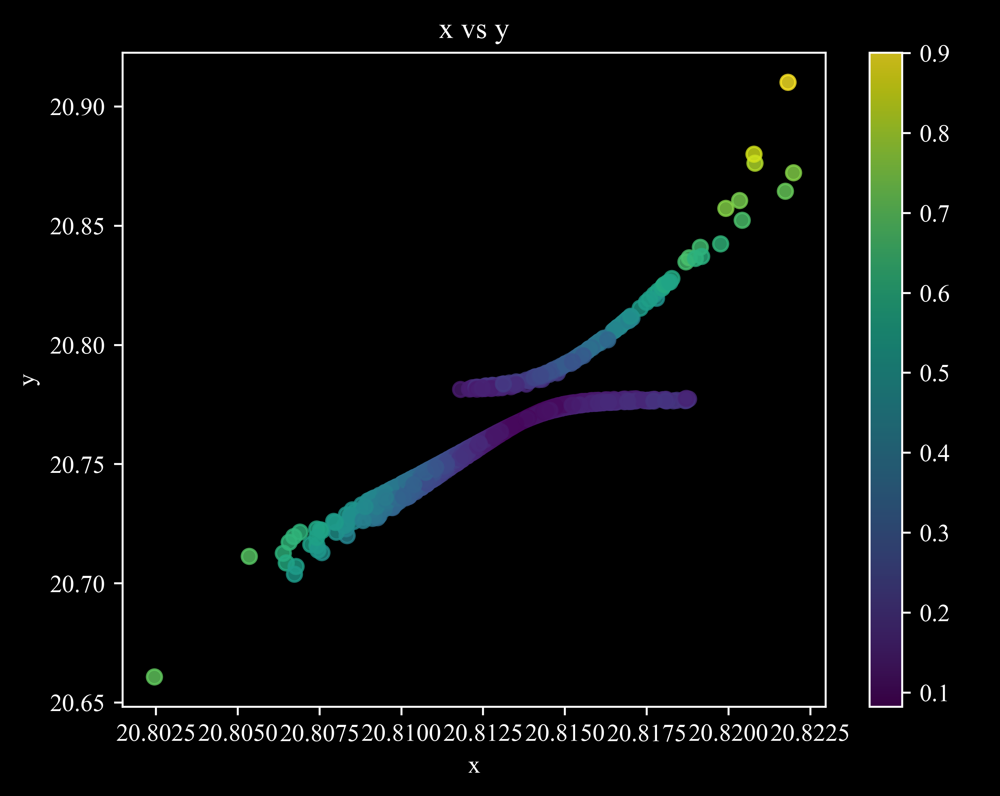

In [93]:
plt.scatter(filtered_df['x'], filtered_df['y'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('y', color = 'w')
plt.title('x vs y')
plt.show()

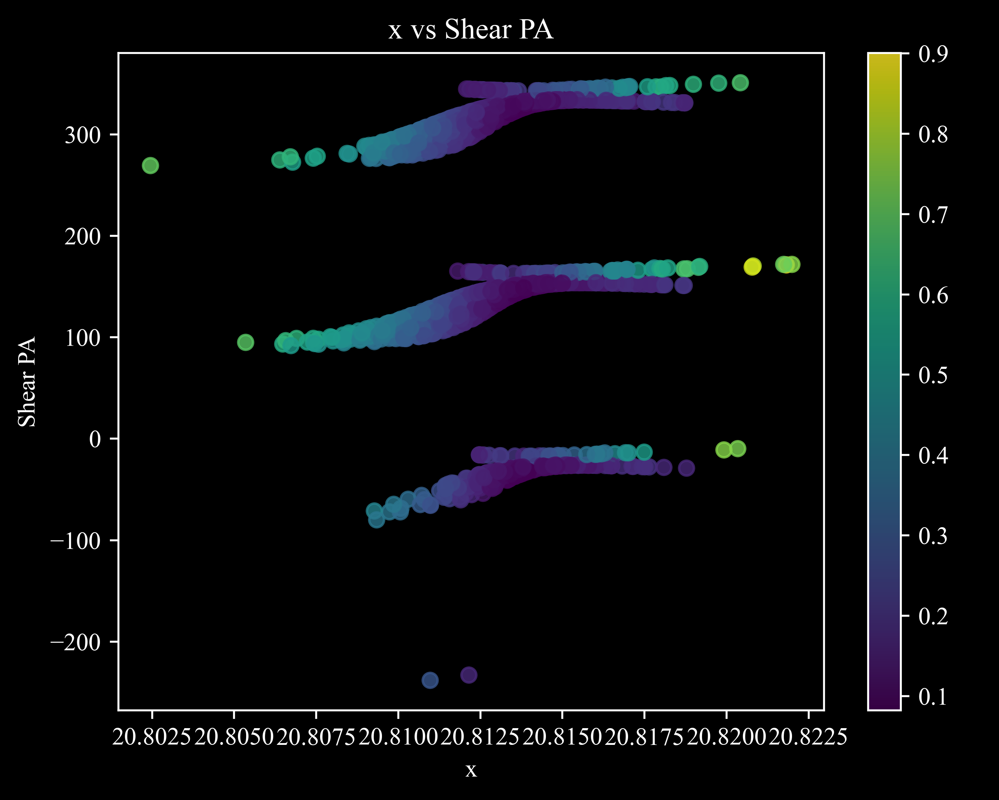

In [96]:
plt.scatter(filtered_df['x'], filtered_df['t_shear_pa'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('x', color = 'w')
plt.ylabel('Shear PA', color = 'w')
plt.title('x vs Shear PA')
plt.show()

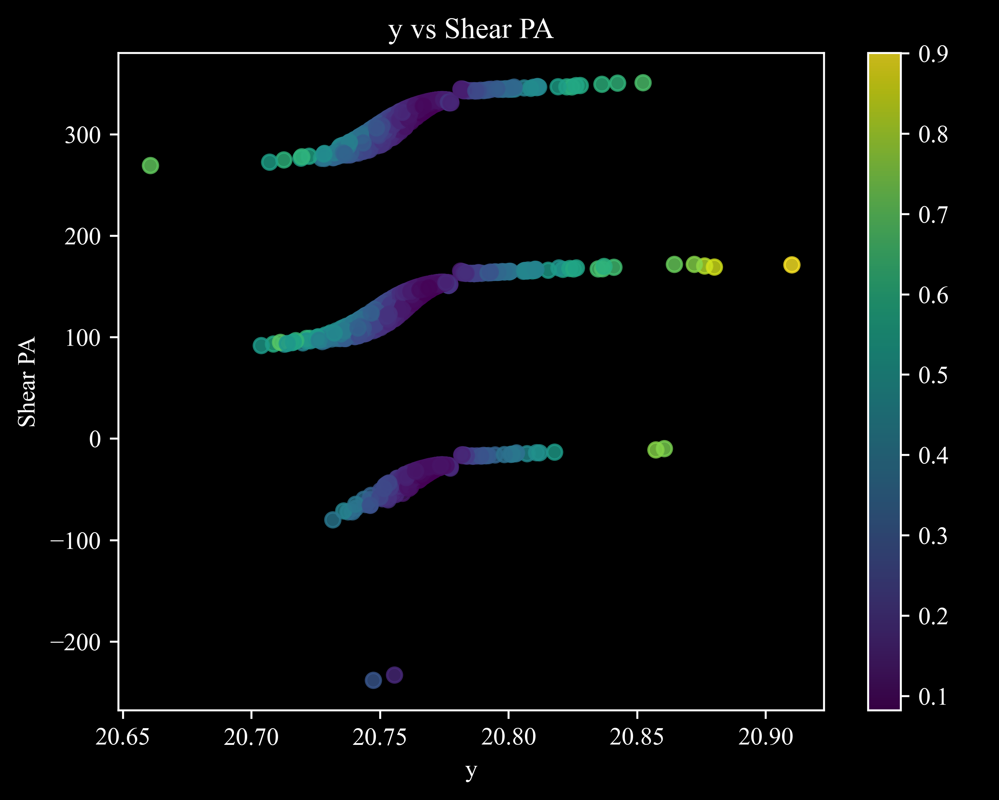

In [97]:
plt.scatter(filtered_df['y'], filtered_df['t_shear_pa'], c=filtered_df['e'], alpha=0.8)
plt.colorbar(label='Ellipticity')
plt.xlabel('y', color = 'w')
plt.ylabel('Shear PA', color = 'w')
plt.title('y vs Shear PA')
plt.show()